In [1]:
import torch

def check_cuda():
    if torch.cuda.is_available():
        print(f"CUDA is available. GPU: {torch.cuda.get_device_name(0)}")
        print("CUDA version:", torch.version.cuda)
    else:
        print("CUDA is not available. Please activate GPY")

check_cuda()

CUDA is available. GPU: Tesla P100-PCIE-16GB
CUDA version: 12.1


In [2]:
!pip install roboflow
!pip install ultralytics
!pip install torch torchvision torchaudio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.1/74.1 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 32.8 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12.1
  Attempting uninstall: certifi
    Found existing installation: certifi 2

In [3]:
import os
import shutil
import numpy as np

# Paths to VOC directories
base_dir = '/kaggle/input/pascal-voc-2012-dataset/VOC2012_train_val/VOC2012_train_val'
images_dir = os.path.join(base_dir, 'JPEGImages')
annotations_dir = os.path.join(base_dir, 'Annotations')
sets_dir = os.path.join(base_dir, 'ImageSets/Main')

# Setup new directory structure
split_base = '/kaggle/working/yolo_dataset'
train_images_dir = os.path.join(split_base, 'images/train')
val_images_dir = os.path.join(split_base, 'images/val')
train_labels_dir = os.path.join(split_base, 'labels/train')
val_labels_dir = os.path.join(split_base, 'labels/val')

os.makedirs(train_images_dir, exist_ok=True)
os.makedirs(val_images_dir, exist_ok=True)
os.makedirs(train_labels_dir, exist_ok=True)
os.makedirs(val_labels_dir, exist_ok=True)

# Function to read predefined splits
def get_files_from_split(file_path):
    with open(file_path, 'r') as f:
        files = [x.strip().split()[0] for x in f.readlines() if not x.startswith('#')]
    return files

# Get all files from trainval.txt
trainval_files = get_files_from_split(os.path.join(sets_dir, 'trainval.txt'))
np.random.shuffle(trainval_files)  # Shuffle to randomize the split

split_index = int(len(trainval_files) * 0.9)
train_files = trainval_files[:split_index]
val_files = trainval_files[split_index:]

# Function for copying files remains the same
def copy_files(files, source_dir, target_dir, file_ext):
    for f in files:
        shutil.copy(os.path.join(source_dir, f + file_ext), os.path.join(target_dir, f + file_ext))

# Proceed with copying images and annotations as before
copy_files(train_files, images_dir, train_images_dir, '.jpg')
copy_files(val_files, images_dir, val_images_dir, '.jpg')
copy_files(train_files, annotations_dir, train_labels_dir, '.xml')
copy_files(val_files, annotations_dir, val_labels_dir, '.xml')

print(f"Total images (trainval): {len(trainval_files)}")
print(f"Training images: {len(train_files)}")
print(f"Validation images: {len(val_files)}")


Total images (trainval): 11540
Training images: 10386
Validation images: 1154


In [4]:
import xml.etree.ElementTree as ET
import os
import shutil
import numpy as np
# Add the convert_annotation function here (assuming you've defined class_mapping)
class_mapping = {
    'aeroplane': 0, 'bicycle': 1, 'bird': 2, 'boat': 3,
    'bottle': 4, 'bus': 5, 'car': 6, 'cat': 7,
    'chair': 8, 'cow': 9, 'diningtable': 10, 'dog': 11,
    'horse': 12, 'motorbike': 13, 'person': 14, 'pottedplant': 15,
    'sheep': 16, 'sofa': 17, 'train': 18, 'tvmonitor': 19
}

def convert_annotation(annotation_path, output_path):
    tree = ET.parse(annotation_path)
    root = tree.getroot()
    size = root.find('size')
    w = int(size.find('width').text)
    h = int(size.find('height').text)
    with open(output_path, 'w') as out_file:
        for obj in root.iter('object'):
            difficult = obj.find('difficult').text
            cls_name = obj.find('name').text
            if int(difficult) == 1 or cls_name not in class_mapping:
                continue
            cls_id = class_mapping[cls_name]
            xmlbox = obj.find('bndbox')
            b = (float(xmlbox.find('xmin').text), float(xmlbox.find('ymin').text),
                 float(xmlbox.find('xmax').text), float(xmlbox.find('ymax').text))
            x_center = ((b[0] + b[2]) / 2) / w
            y_center = ((b[1] + b[3]) / 2) / h
            bbox_width = (b[2] - b[0]) / w
            bbox_height = (b[3] - b[1]) / h
            out_file.write(f"{cls_id} {x_center} {y_center} {bbox_width} {bbox_height}\n")

# Adjusted function to handle XML to TXT conversion
def process_and_convert_files(files, img_source_dir, img_target_dir, ann_source_dir, ann_target_dir):
    for f in files:
        # Copy images
        img_path = os.path.join(img_source_dir, f + '.jpg')
        shutil.copy(img_path, img_target_dir)
        
        # Convert annotations
        xml_path = os.path.join(ann_source_dir, f + '.xml')
        txt_path = os.path.join(ann_target_dir, f + '.txt')
        convert_annotation(xml_path, txt_path)

# Process training files
process_and_convert_files(train_files, images_dir, train_images_dir, annotations_dir, train_labels_dir)

# Process validation files
process_and_convert_files(val_files, images_dir, val_images_dir, annotations_dir, val_labels_dir)

print(f"Total images (trainval): {len(trainval_files)}")
print(f"Training images: {len(train_files)}")
print(f"Validation images: {len(val_files)}")

Total images (trainval): 11540
Training images: 10386
Validation images: 1154


In [5]:
import wandb

API_KEY="295ff1a9ae5a3abb2608d9f7db97c31758ee8e4f"
wandb.login(key=API_KEY)

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [6]:
from ultralytics import YOLO

# Initialize model with a specific configuration and pre-trained weights
model = YOLO('yolov8n.pt')  # You can choose a different model size based on your needs and hardware

# Train the model
model.train(data='/kaggle/input/data-yaml/data.yaml', epochs=50,
            imgsz=640,
            batch=16,  # Corrected argument name from 'batch_size' to 'batch'
            project='yolov8',
            name='yolov8_experiment',
            exist_ok=True)

100%|██████████| 6.23M/6.23M [00:00<00:00, 165MB/s]


Ultralytics YOLOv8.1.47 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/input/data-yaml/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=yolov8, name=yolov8_experiment, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=T

100%|██████████| 755k/755k [00:00<00:00, 44.1MB/s]
2024-04-16 22:51:32,152	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-04-16 22:51:34,062	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-04-16 22:51:36.393759: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-16 22:51:36.393884: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-16 22:51:36.529020: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS facto

Overriding model.yaml nc=80 with nc=20

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

wandb: Currently logged in as: younes4matrab. Use `wandb login --relogin` to force relogin
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/wandb/sdk/wandb_init.py", line 1187, in init
    run = wi.init()
  File "/opt/conda/lib/python3.10/site-packages/wandb/sdk/wandb_init.py", line 818, in init
    run_start_result = run_start_handle.wait(timeout=30)
  File "/opt/conda/lib/python3.10/site-packages/wandb/sdk/lib/mailbox.py", line 283, in wait
    found, abandoned = self._slot._get_and_clear(timeout=wait_timeout)
  File "/opt/conda/lib/python3.10/site-packages/wandb/sdk/lib/mailbox.py", line 130, in _get_and_clear
    if self._wait(timeout=timeout):
  File "/opt/conda/lib/python3.10/site-packages/wandb/sdk/lib/mailbox.py", line 126, in _wait
    return self._event.wait(timeout=timeout)
  File "/opt/conda/lib/python3.10/threading.py", line 607, in wait
    signaled = self._cond.wait(timeout)
  File "/opt/conda/lib/python3.10/threading.py", line 324, in w

Error: An unexpected error occurred

# Model Evaluation

In [ ]:
import wandb

API_KEY="295ff1a9ae5a3abb2608d9f7db97c31758ee8e4f"
wandb.login(key=API_KEY)

from ultralytics import YOLO

# Load the model
#model_path='/kaggle/working/artifacts/run_wivfpt02_model:v0/best.pt'
model = YOLO(model_path)

In [10]:
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps 

Ultralytics YOLOv8.1.47 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla P100-PCIE-16GB, 16276MiB)


val: Scanning /kaggle/working/yolo_dataset/labels/val... 1154 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1154/1154 [00:01<00:00, 1131.76it/s]


val: New cache created: /kaggle/working/yolo_dataset/labels/val.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 73/73 [00:11<00:00,  6.11it/s]


                   all       1154       2701      0.936      0.846      0.934      0.775
             aeroplane       1154         92      0.934      0.919      0.974      0.831
               bicycle       1154         81      0.963      0.864       0.93      0.817
                  bird       1154        112      0.972       0.92      0.972      0.799
                  boat       1154        100      0.918      0.783       0.91      0.679
                bottle       1154        129       0.93      0.726      0.878      0.694
                   bus       1154         42      0.951      0.927      0.977      0.884
                   car       1154        209      0.943      0.751       0.92      0.736
                   cat       1154        106      0.993      0.925      0.958      0.861
                 chair       1154        165      0.905      0.703      0.841      0.664
                   cow       1154         61      0.933      0.885      0.941       0.78
           diningtabl

array([    0.83078,     0.81691,     0.79866,     0.67876,     0.69383,     0.88378,     0.73611,     0.86073,     0.66446,     0.78026,     0.75689,     0.82966,     0.81614,     0.83092,     0.77201,     0.57449,     0.72138,      0.8037,     0.85187,     0.80704])

# Model Inference

In [7]:
import wandb

# Initialize wandb
run = wandb.init()

# Replace 'your_project_name/model_name:version' with the actual artifact name
artifact = run.use_artifact('yolov8_50/run_wivfpt02_model:v0', type='model')
artifact_dir = artifact.download()

# Assuming the model is saved as 'best.pt' in the artifact
model_path = artifact_dir + '/best.pt'

wandb:   1 of 1 files downloaded.  


In [8]:
from ultralytics import YOLO

# Load the model
#model_path='/kaggle/working/artifacts/run_wivfpt02_model:v0/best.pt'
model = YOLO(model_path)

In [7]:
# Perform inference
results = model.predict('/kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2008_000020.jpg')
detections = results[0].boxes
# Iterate over detected objects and print their class and confidence score
for i, det in enumerate(detections):
    # Access attributes from each detection
    conf = det.conf.item()  # Convert tensor to float
    class_id = int(det.cls)  # Class ID
    class_name = results[0].names[class_id]  # Corrected access to class names

    #print(f"Detection {i+1}: {class_name} ({conf:.2f})")

# Initialize a dictionary to hold counts of detected objects by class
class_counts = {}

for det in detections:
    class_id = int(det.cls)  # Extract class ID
    class_name = results[0].names[class_id]
    # Increment count for the detected class
    if class_name in class_counts:
        class_counts[class_name] += 1
    else:
        class_counts[class_name] = 1


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2008_000020.jpg: 384x640 1 dog, 1 person, 10.2ms
Speed: 3.0ms preprocess, 10.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)



image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2011_004297.jpg: 640x480 3 persons, 57.1ms
Speed: 2.3ms preprocess, 57.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


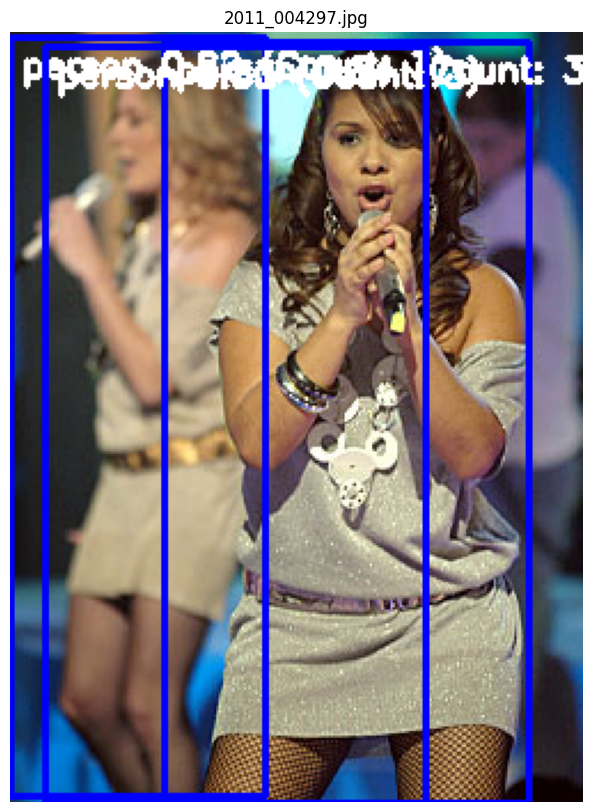


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2008_005454.jpg: 480x640 4 persons, 1 train, 55.1ms
Speed: 3.0ms preprocess, 55.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


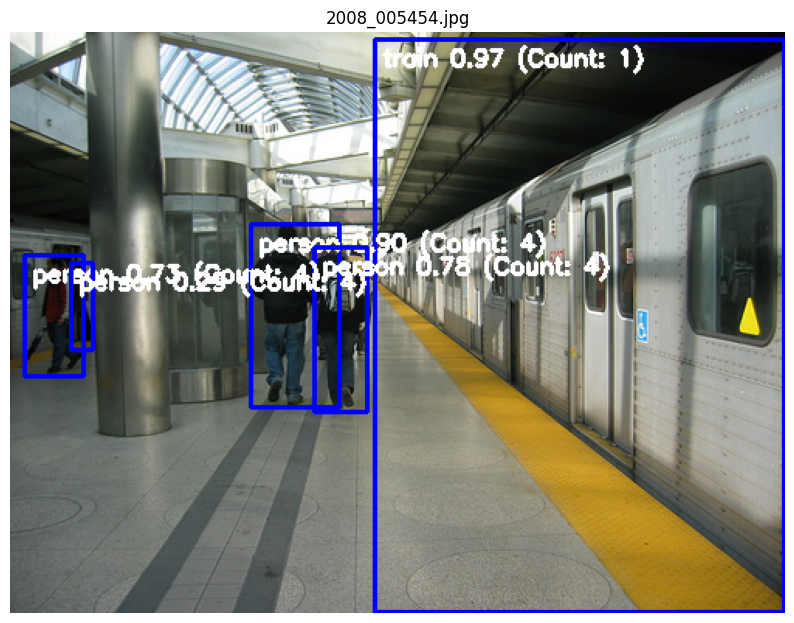


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2010_002001.jpg: 640x480 2 chairs, 7.4ms
Speed: 1.9ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


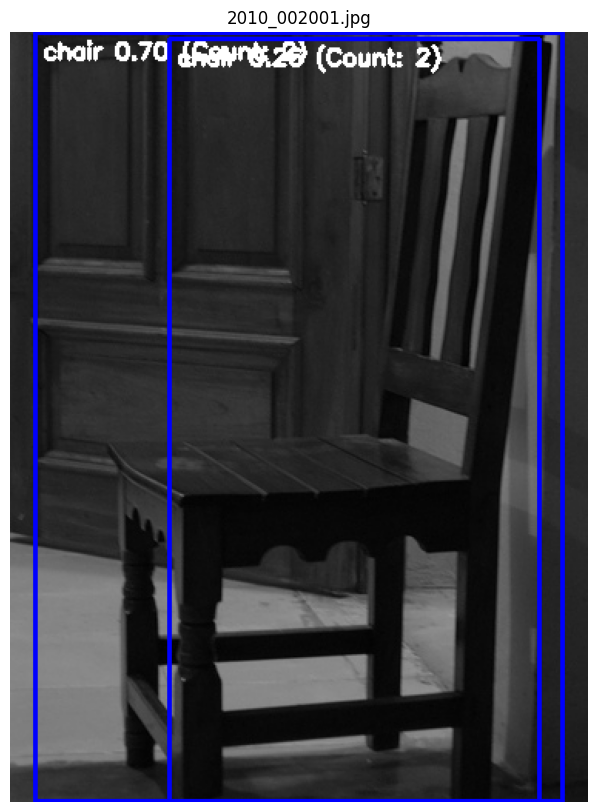


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2008_004901.jpg: 480x640 1 motorbike, 8.0ms
Speed: 2.1ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


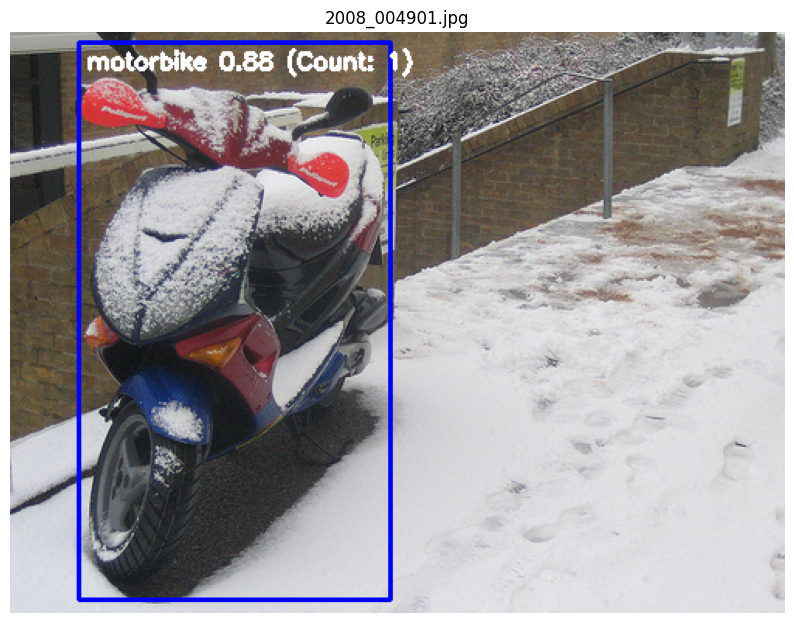


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2011_003248.jpg: 480x640 1 person, 1 tvmonitor, 6.8ms
Speed: 2.1ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


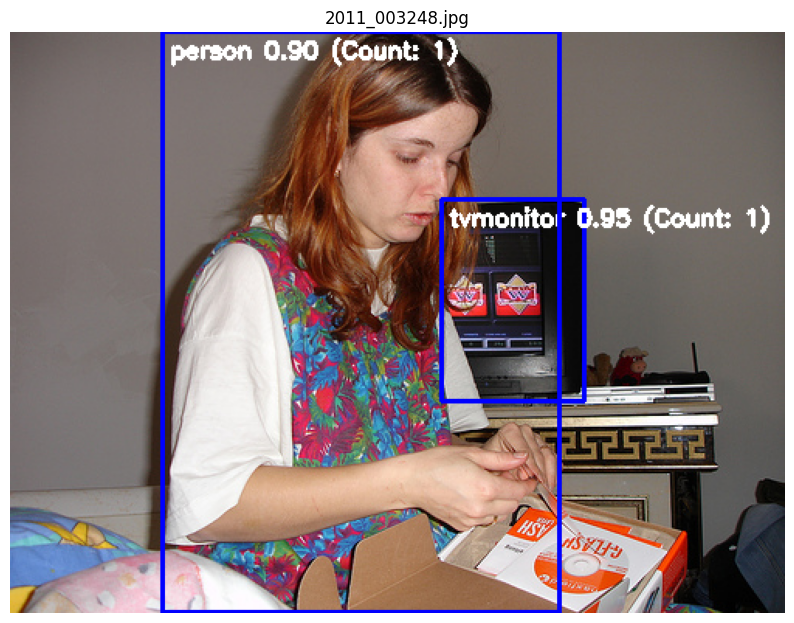


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2008_006931.jpg: 416x640 1 dog, 56.1ms
Speed: 2.0ms preprocess, 56.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 640)


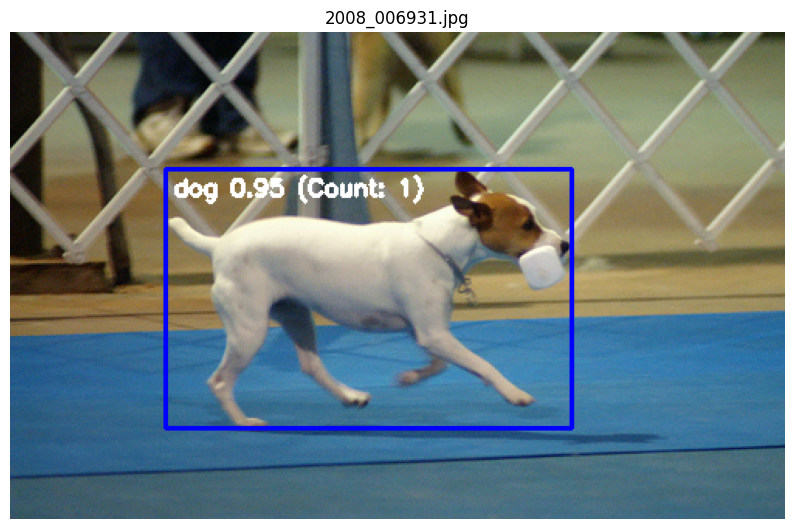


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2010_004155.jpg: 448x640 1 cat, 54.4ms
Speed: 1.9ms preprocess, 54.4ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


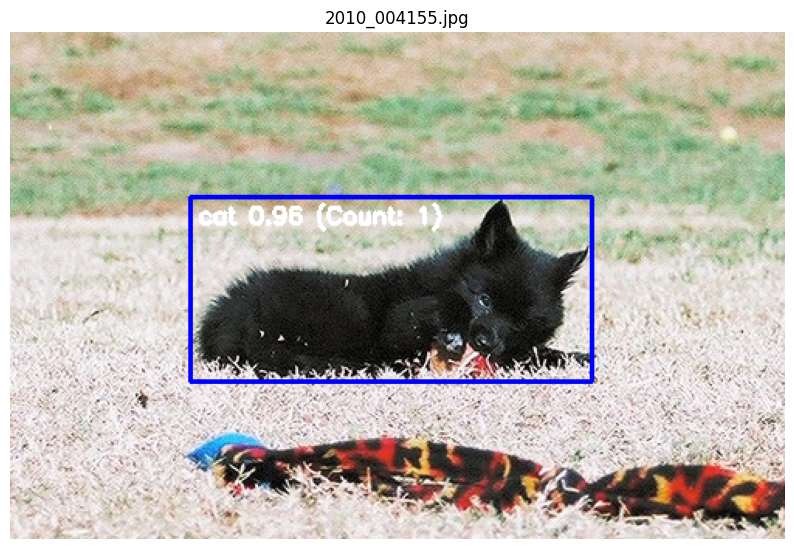


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2008_005640.jpg: 384x640 1 cat, 8.1ms
Speed: 1.7ms preprocess, 8.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


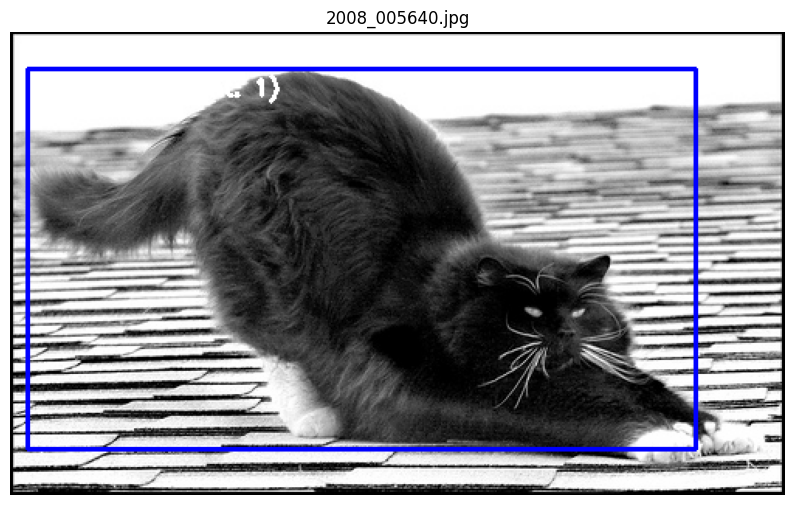


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2009_001161.jpg: 448x640 1 aeroplane, 7.6ms
Speed: 2.0ms preprocess, 7.6ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


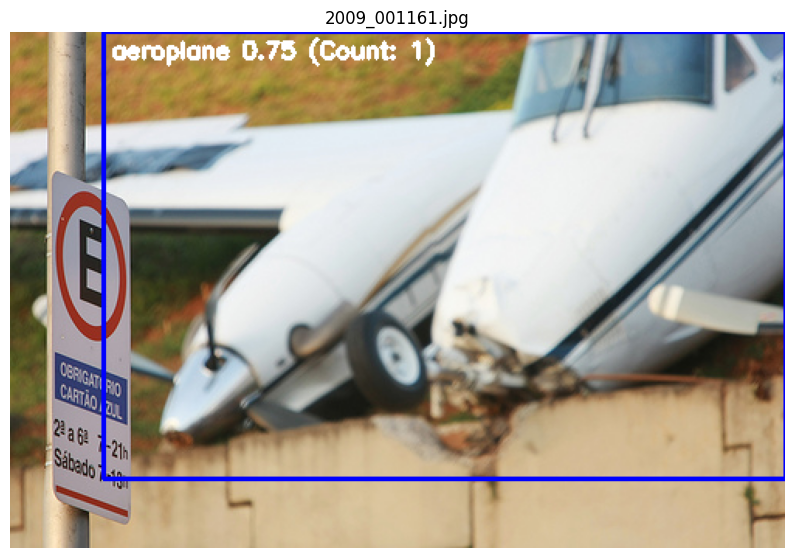


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2008_008752.jpg: 640x480 1 train, 7.3ms
Speed: 2.0ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


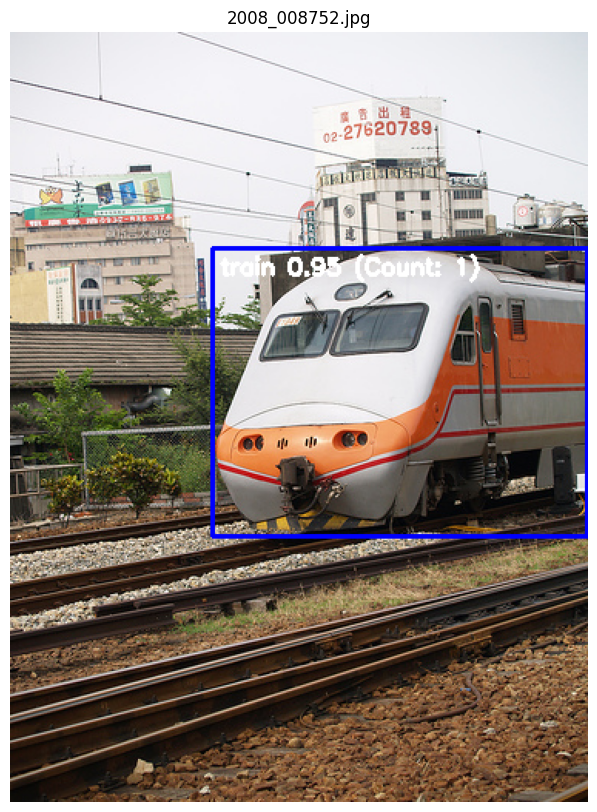


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2011_000489.jpg: 448x640 1 person, 7.3ms
Speed: 1.8ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


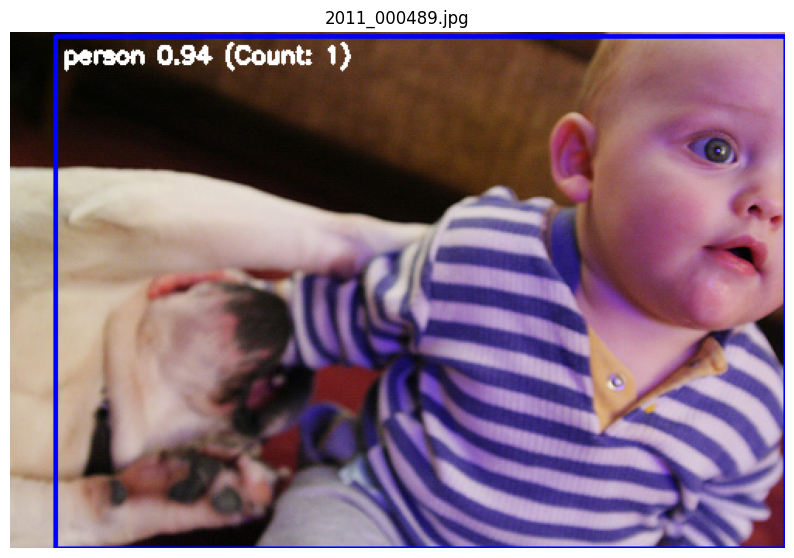


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2011_000710.jpg: 448x640 1 chair, 1 pottedplant, 1 sofa, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)


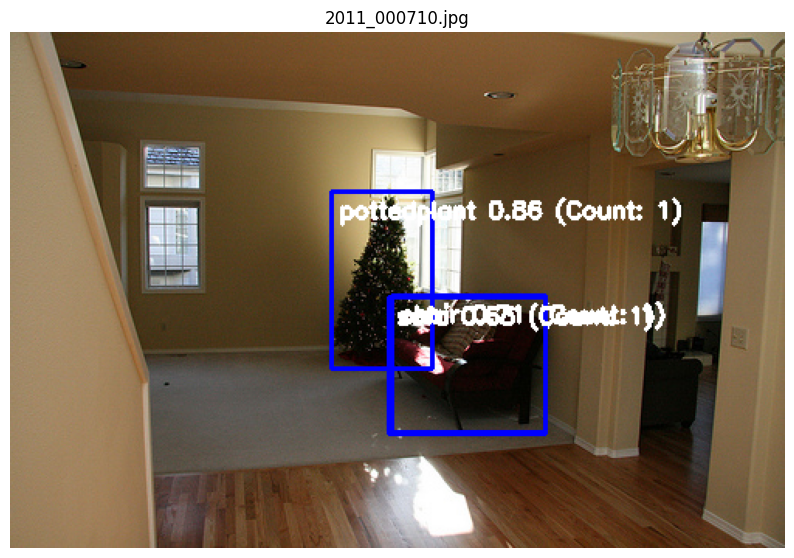


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2009_002992.jpg: 480x640 2 cars, 7.6ms
Speed: 2.0ms preprocess, 7.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


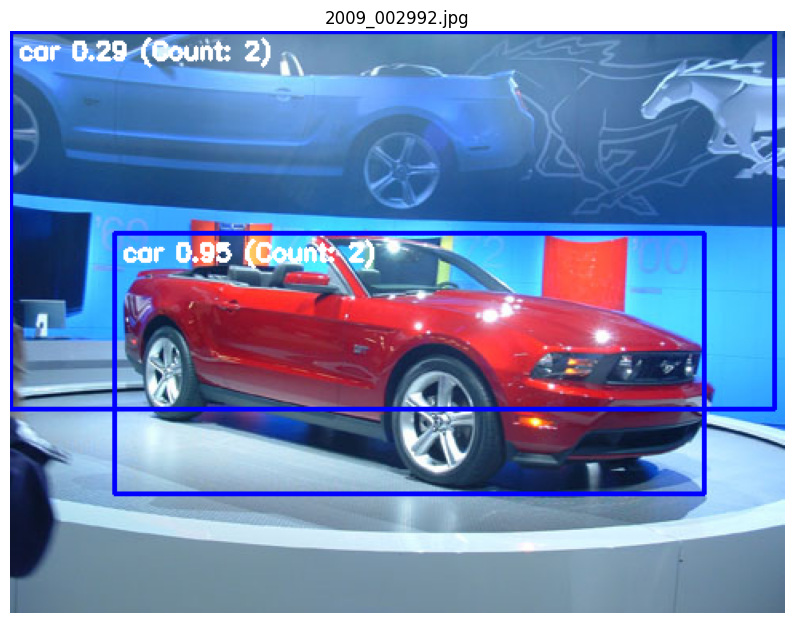


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2011_003200.jpg: 512x640 8 persons, 54.5ms
Speed: 2.3ms preprocess, 54.5ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


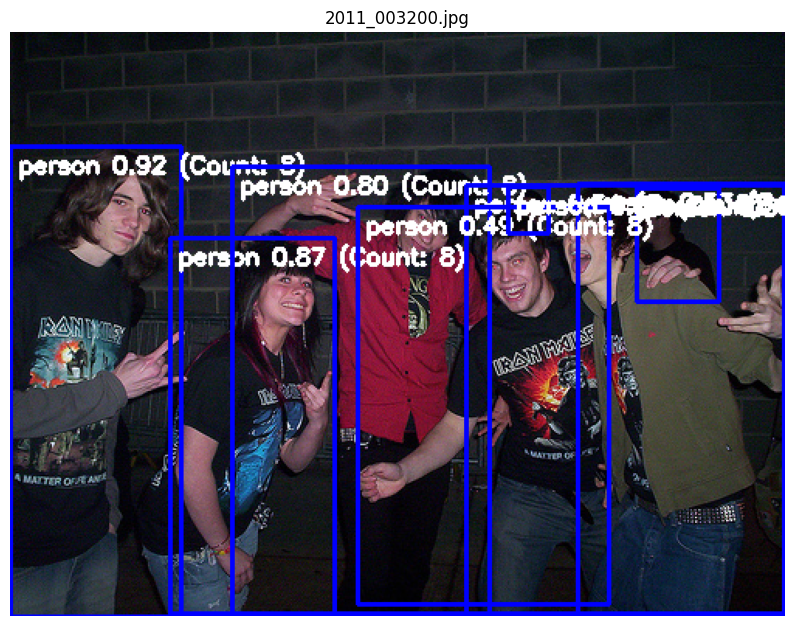


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2008_003649.jpg: 480x640 4 chairs, 9.9ms
Speed: 2.7ms preprocess, 9.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


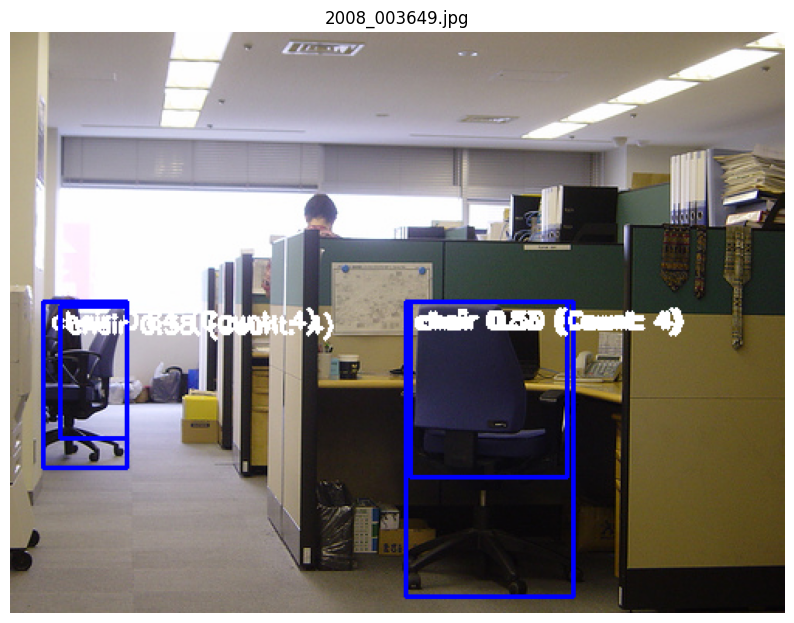


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2010_002063.jpg: 480x640 1 sheep, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


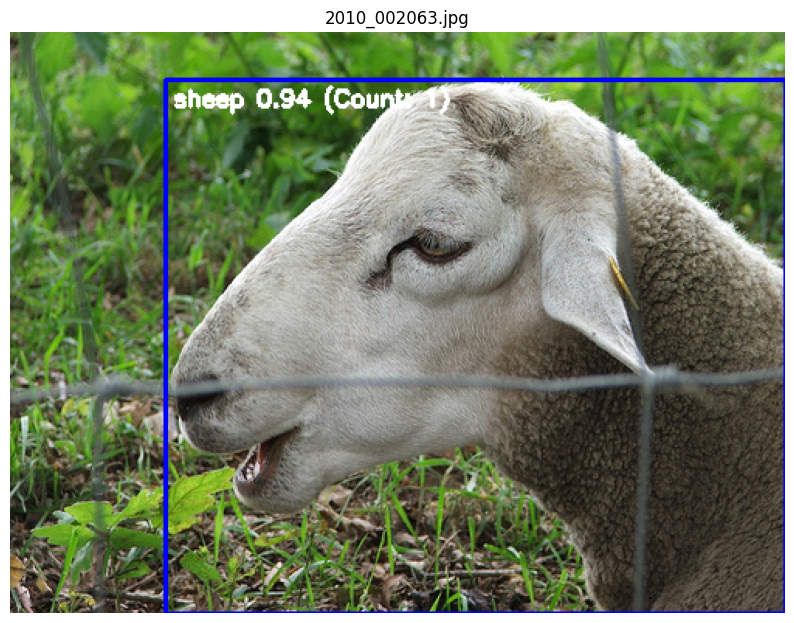


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2009_002949.jpg: 608x640 1 dog, 55.9ms
Speed: 2.5ms preprocess, 55.9ms inference, 1.3ms postprocess per image at shape (1, 3, 608, 640)


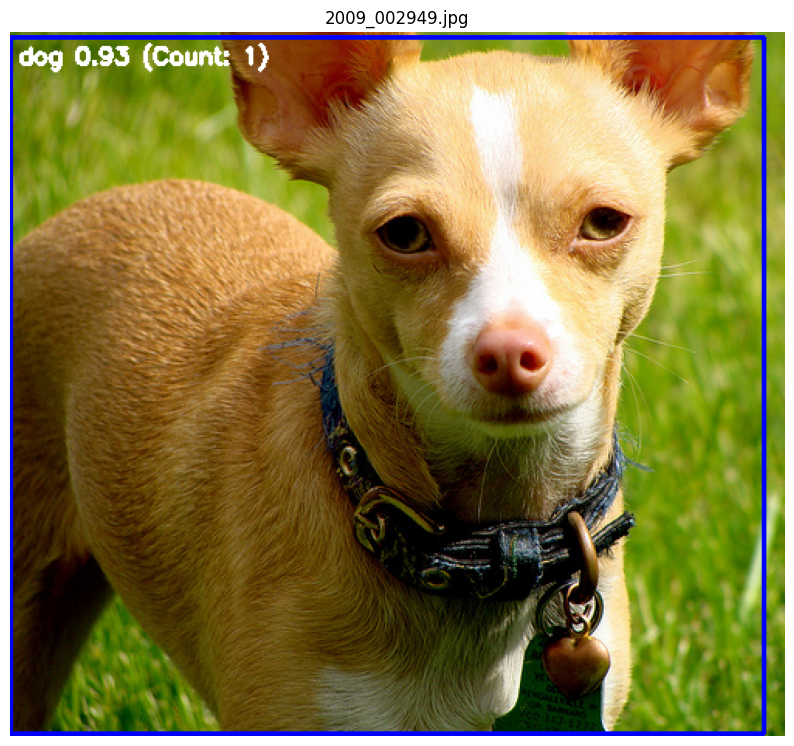


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2012_001793.jpg: 480x640 1 dog, 5 persons, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


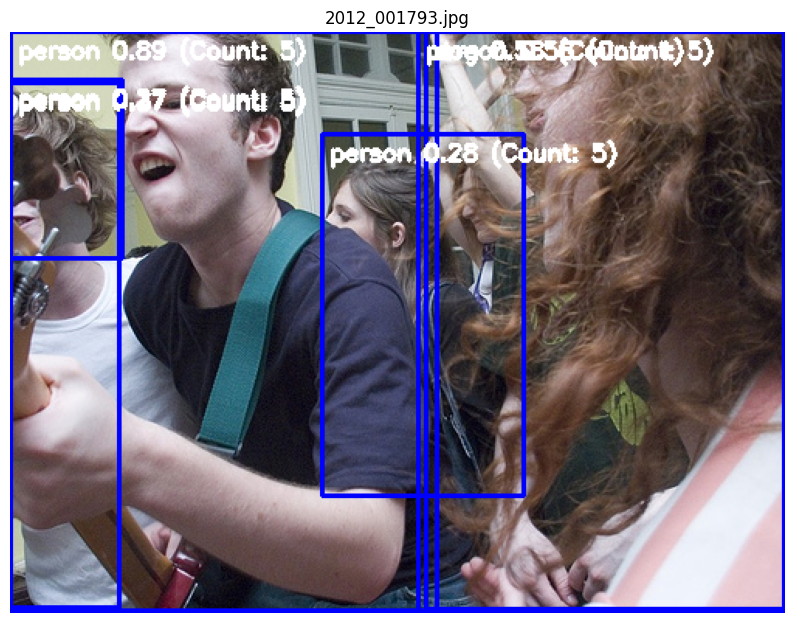


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2011_000046.jpg: 480x640 1 person, 6.9ms
Speed: 2.1ms preprocess, 6.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


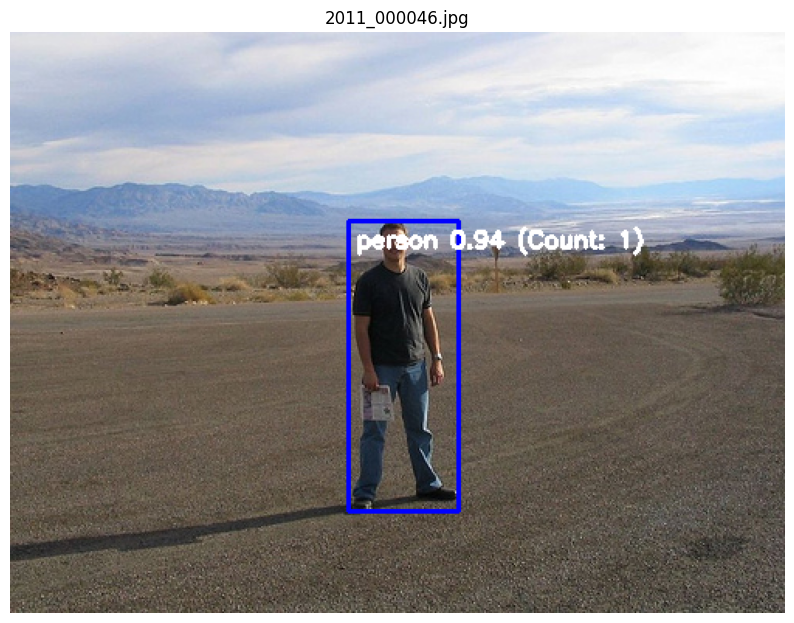


image 1/1 /kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages/2009_001116.jpg: 480x640 1 chair, 1 pottedplant, 1 sofa, 1 tvmonitor, 6.7ms
Speed: 1.9ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


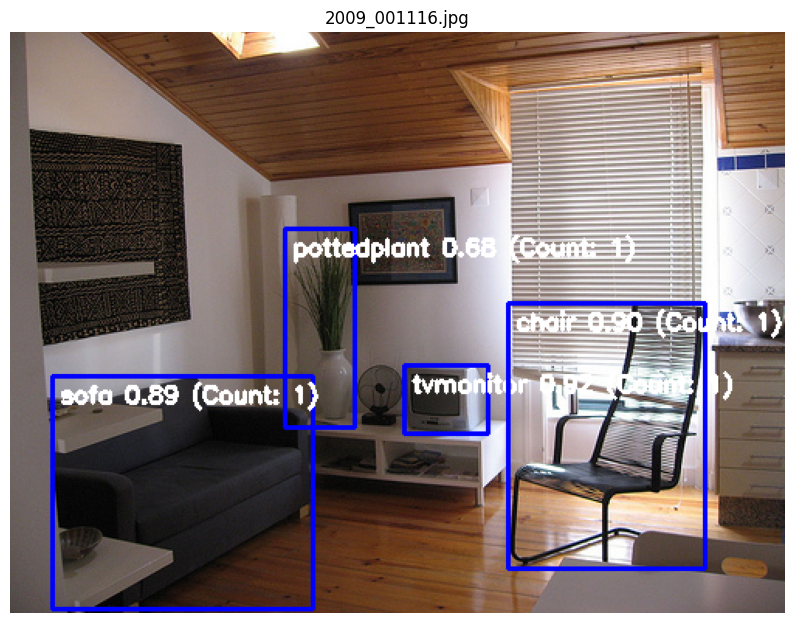

In [11]:
import os

# Directory containing the images
image_dir = '/kaggle/input/pascal-voc-2012-dataset/VOC2012_test/VOC2012_test/JPEGImages'

# Get the list of image files
image_files = os.listdir(image_dir)

# Ensure that there are at least 20 images
num_images_to_process = min(20, len(image_files))

# Iterate over the first 20 image files in the directory
for filename in image_files[:num_images_to_process]:
    # Check if the file is an image file
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Construct the full path to the image file
        image_path = os.path.join(image_dir, filename)
        
        # Perform inference on the image
        results = model.predict(image_path)
        detections = results[0].boxes
        
        # Initialize a dictionary to hold counts of detected objects by class
        class_counts = {}
        
        for det in detections:
            class_id = int(det.cls)  # Extract class ID
            class_name = results[0].names[class_id]
            # Increment count for the detected class
            if class_name in class_counts:
                class_counts[class_name] += 1
            else:
                class_counts[class_name] = 1
        
        # Load the image
        image = cv2.imread(image_path)
        
        # Iterate over detected objects and draw bounding box and annotations
        for i, det in enumerate(detections):
            # Extract bounding box coordinates, confidence, and class_id
            x1, y1, x2, y2 = map(int, det.xyxy[0].cpu().numpy())
            conf = det.conf.item()  # Convert tensor to float
            class_id = int(det.cls)  # Convert tensor to int
            class_name = results[0].names[class_id]
        
            # Draw bounding box
            box_color = (255, 0, 0)  # Blue color for the box
            cv2.rectangle(image, (x1, y1), (x2, y2), box_color, 2)
        
            # Annotation text for class name and confidence
            label = f"{class_name} {conf:.2f} (Count: {class_counts[class_name]})"
        
            # Determine text size (width and height)
            text_size = cv2.getTextSize(label, font, font_scale, font_thickness)[0]
            text_width = text_size[0]
            text_height = text_size[1]
        
            # Calculate position for the text (inside the top-left corner of the bounding box)
            text_x = x1 + 5  # 5 pixels from the left edge of the bounding box
            text_y = max(y1 + text_height + 5, y1 + 5)  # 5 pixels above the top edge of the bounding box
        
            # Insert the label text inside the bounding box
            cv2.putText(image, label, (text_x, text_y), font, font_scale, font_color, font_thickness)
        
        # Convert the BGR image to RGB
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Display the image with detections
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.axis('off')
        plt.title(filename)
        plt.show()